In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings; warnings.filterwarnings('ignore')

In [3]:
import tensorflow as tf

In [4]:
import numpy as np

In [5]:
import cv2

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
from configs import CONFIG_MAP



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [8]:
from trained_model import TrainedModel

In [9]:
from image_vae import Autoencoder

In [10]:
from pathlib import Path

In [11]:
from magenta.music import sequence_proto_to_midi_file

In [12]:
from magenta.music.notebook_utils import play_sequence, plot_sequence

In [42]:
from IPython.display import display

In [93]:
from ipywidgets import VBox, Layout, Image, Audio

In [43]:
import PIL

In [13]:
from magenta.scripts.convert_dir_to_note_sequences import convert_midi

In [14]:
config = CONFIG_MAP['cat-mel_2bar_small']

In [15]:
checkpoint_dir = '../../checkpoints9/train'

In [16]:
tf.reset_default_graph()

In [17]:
model = TrainedModel(config, 16, checkpoint_dir)


INFO:tensorflow:Building MusicVAE model with BidirectionalLstmEncoder, CategoricalLstmDecoder, and hparams:
{'max_seq_len': 32, 'z_size': 256, 'free_bits': 0, 'max_beta': 0.2, 'beta_rate': 0.99999, 'batch_size': 16, 'grad_clip': 1.0, 'clip_mode': 'global_norm', 'grad_norm_clip_to_zero': 10000, 'learning_rate': 0.001, 'decay_rate': 0.9999, 'min_learning_rate': 1e-05, 'conditional': True, 'dec_rnn_size': [256, 256], 'enc_rnn_size': [512], 'dropout_keep_prob': 1.0, 'sampling_schedule': 'inverse_sigmoid', 'sampling_rate': 1000, 'use_cudnn': False, 'residual_encoder': False, 'residual_decoder': False, 'image_batch_size': 16}

yayayayaya
INFO:tensorflow:
Encoder Cells (bidirectional):
  units: [512]


Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.
INFO:tensorflow:
Decoder Cells:
  units: [256, 256]



Instructions for updating:
Use `tf.cast` instead.








Instructions for updating:
Use keras.layers.D

In [50]:
IMG_PATH_SN = Path('../../GAPED/GAPED/Sn_j/')

In [101]:
images = np.random.choice(list(map(str, IMG_PATH_SN.glob('*.jpg'))), size=5)

In [102]:
images

array(['../../GAPED/GAPED/Sn_j/Sn065.jpg',
       '../../GAPED/GAPED/Sn_j/Sn079.jpg',
       '../../GAPED/GAPED/Sn_j/Sn125.jpg',
       '../../GAPED/GAPED/Sn_j/Sn068.jpg',
       '../../GAPED/GAPED/Sn_j/Sn076.jpg'], dtype='<U32')

In [35]:
def decode_img(path):
    img = cv2.imread(path)
    img = np.asarray(img).astype(np.float32) / 255.
    img = cv2.resize(img, (64, 64))
    return img

In [103]:
img = [decode_img(path) for path in images]

In [104]:
img = np.stack(img, axis=0)

In [105]:
img.shape, img.dtype

((5, 64, 64, 3), dtype('float32'))

In [106]:
output_ns = model.image_to_music(img)

In [107]:
len(output_ns)

5

Loading BokehJS ...

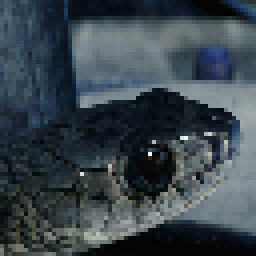

Loading BokehJS ...

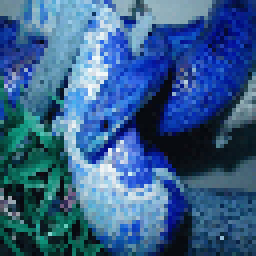

Loading BokehJS ...

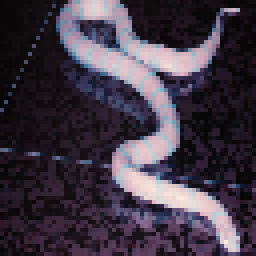

Loading BokehJS ...

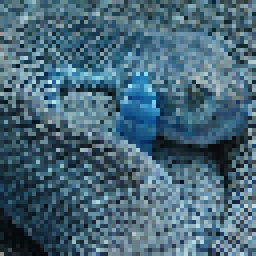

Loading BokehJS ...

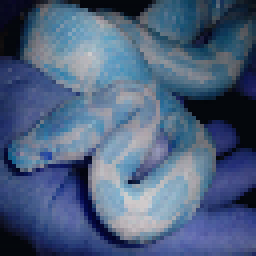

In [108]:
for i, ns in enumerate(output_ns):
    plot_sequence(ns)
    play_sequence(ns)
    image = PIL.Image.fromarray((img[i] * 255.).astype(np.uint8))
    display(image.resize((256, 256)))

In [49]:
IMG_PATH_POS = Path('../../GAPED/GAPED/P_j/')

In [53]:
images_pos = np.random.choice(list(map(str, IMG_PATH_POS.glob('*.jpg'))), size=5)

In [55]:
images_pos

array(['../../GAPED/GAPED/P_j/P004.jpg', '../../GAPED/GAPED/P_j/P092.jpg',
       '../../GAPED/GAPED/P_j/P010.jpg', '../../GAPED/GAPED/P_j/P095.jpg',
       '../../GAPED/GAPED/P_j/P101.jpg'], dtype='<U30')

In [56]:
images_pos = np.stack([decode_img(path) for path in images_pos])

In [58]:
images_pos.shape, images_pos.dtype

((5, 64, 64, 3), dtype('float32'))

In [59]:
output_ns_pos = model.image_to_music(images_pos)

Loading BokehJS ...

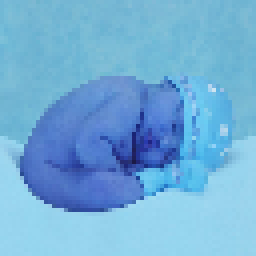

Loading BokehJS ...

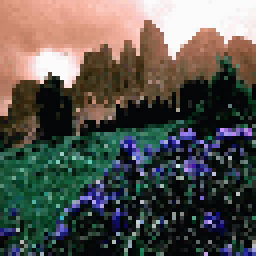

Loading BokehJS ...

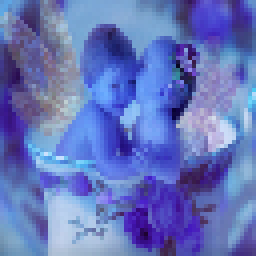

Loading BokehJS ...

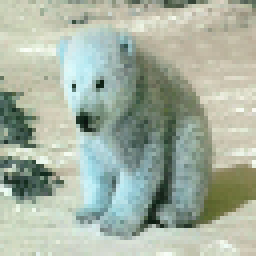

Loading BokehJS ...

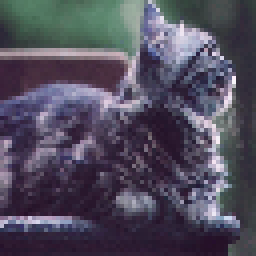

In [61]:
for i, ns in enumerate(output_ns_pos):
    plot_sequence(ns)
    play_sequence(ns)
    image = PIL.Image.fromarray((images_pos[i] * 255.).astype(np.uint8))
    display(image.resize((256, 256)))

In [62]:
MIDI_PATH_METAL = Path('../../../../clean_midi/Metallica/')

In [63]:
midis = np.random.choice(list(map(str, MIDI_PATH_METAL.glob('*.mid'))), size=5)

In [64]:
midis

array(['../../../../clean_midi/Metallica/Jump in the Fire.mid',
       '../../../../clean_midi/Metallica/Mama Said.1.mid',
       '../../../../clean_midi/Metallica/Wherever I May Roam.1.mid',
       '../../../../clean_midi/Metallica/For Whom the Bell Tolls.mid',
       '../../../../clean_midi/Metallica/One.3.mid'], dtype='<U67')

In [65]:
midis = [convert_midi('', '', path) for path in midis]


INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Metallica/Jump in the Fire.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Metallica/Mama Said.1.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Metallica/Wherever I May Roam.1.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Metallica/For Whom the Bell Tolls.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Metallica/One.3.mid.


In [67]:
midis = [config.data_converter.to_notesequences(config.data_converter.to_tensors(midi)[0])[0] for midi in midis]

In [68]:
output_imgs = model.music_to_image(midis)

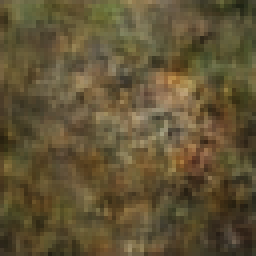

Loading BokehJS ...

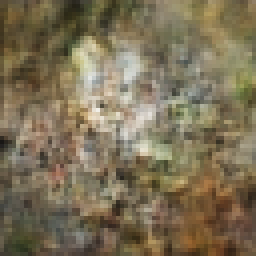

Loading BokehJS ...

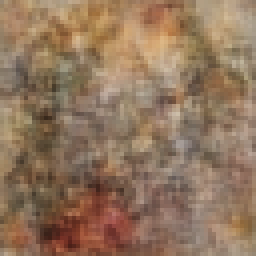

Loading BokehJS ...

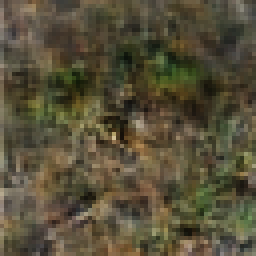

Loading BokehJS ...

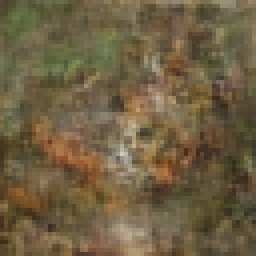

Loading BokehJS ...

In [69]:
for i, img in enumerate(output_imgs):
    image = PIL.Image.fromarray((img * 255.).astype(np.uint8))
    display(image.resize((256, 256)))
    plot_sequence(midis[i])
    play_sequence(midis[i])

In [70]:
MIDI_PATH_EJ = Path('../../../../clean_midi/Elton John/')

In [76]:
midis_ej = np.random.choice(list(map(str, MIDI_PATH_EJ.glob('*.mid'))), size=5)

In [77]:
midis_ej

array(['../../../../clean_midi/Elton John/A Word in Spanish.1.mid',
       '../../../../clean_midi/Elton John/Song for Guy.mid',
       '../../../../clean_midi/Elton John/Friends.mid',
       '../../../../clean_midi/Elton John/Rocket Man.mid',
       '../../../../clean_midi/Elton John/Your Song.mid'], dtype='<U101')

In [80]:
midis_ej = [convert_midi('', '', path) for path in midis_ej]

INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Elton John/Song for Guy.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Elton John/Friends.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Elton John/Rocket Man.mid.
INFO:tensorflow:Converted MIDI file ../../../../clean_midi/Elton John/Your Song.mid.


In [82]:
midis_ej = [config.data_converter.to_notesequences(config.data_converter.to_tensors(midi)[0])[0] for midi in midis_ej if midi is not None]

In [83]:
output_imgs_ej = model.music_to_image(midis_ej)

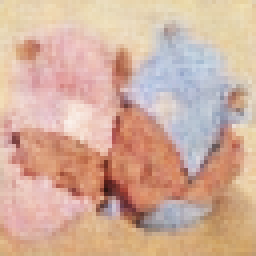

Loading BokehJS ...

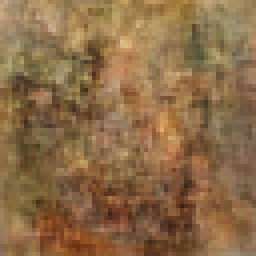

Loading BokehJS ...

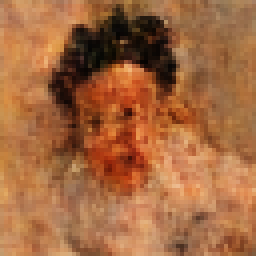

Loading BokehJS ...

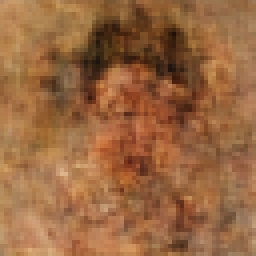

Loading BokehJS ...

In [95]:
for i, img in enumerate(output_imgs_ej):
    image = PIL.Image.fromarray((img * 255.).astype(np.uint8))
    display(image.resize((256, 256)))
    plot_sequence(midis_ej[i])
    play_sequence(midis_ej[i])